In [15]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.backends.backend_pdf import PdfPages
import pandas as pd
pd.options.display.max_rows = None
pd.options.display.max_columns = None
plt.rcParams['mathtext.fontset'],plt.rcParams['font.family'] = 'stix','STIXGeneral'
import seaborn as sns
sns.set_context('talk')

In [2]:
import PIPS

In [3]:
from scipy.optimize import curve_fit

In [4]:
version = '13'

# Import table

In [5]:
summary = pd.read_csv(f'summary_ver{version}.csv').set_index('id').sort_values(by='id')

In [6]:
def getdata_filtered(name):
    path = summary.loc[name,'field']+'/summary/'+summary.loc[name,'H&M_id'][-3:]+'.dat'
    data_V = PIPS.data_readin_LPP(path,filter='V')
    err_threshold = None if np.isnan(summary.loc[name,'err_cut']) else summary.loc[name,'err_cut']
    mag_upper = None if np.isnan(summary.loc[name]['priors_mag_upper']) else summary.loc[name]['priors_mag_upper']
    mag_lower = None if np.isnan(summary.loc[name]['priors_mag_lower']) else summary.loc[name]['priors_mag_lower']
    period = summary.loc[name]['period']
    
    original = PIPS.photdata(data_V)
    original.err_cut_threshold = err_threshold
    filtered = original.phot_err_cut().phot_mag_cut(mag_upper,mag_lower)
    new_yerr = []
    for i in filtered.yerr:
        new_yerr.append(0.03 if i<0.03 else i)
    filtered.yerr = np.array(new_yerr)
    filtered.mag_err = filtered.yerr
    filtered.period = period
    filtered.label = name
    
    return filtered

In [7]:
v003 = getdata_filtered('V003')

Text(0, 0.5, '$V$ [mag]')

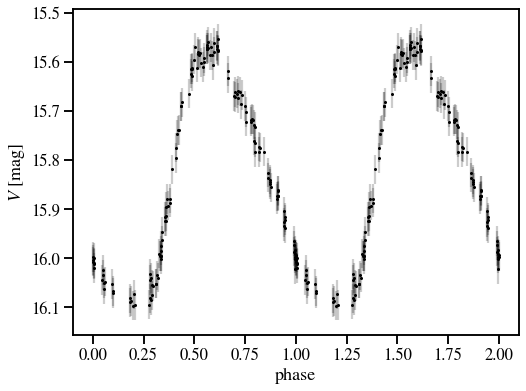

In [17]:
fig,ax = plt.subplots(1,1,figsize=(8,6))
name = 'V003'
phot_obj = getdata_filtered(name)
period = phot_obj.period
x_folded = phot_obj.x%period
y = phot_obj.y
yerr = phot_obj.yerr
markers1, caps1, bars1 = ax.errorbar(x_folded/period,y,yerr,ms=2,c='k',fmt='o')
markers2, caps2, bars2 = ax.errorbar(x_folded/period+1,y,yerr,ms=2,c='k',fmt='o')
[bar.set_alpha(0.2) for bar in bars1]
[bar.set_alpha(0.2) for bar in bars2]
[cap.set_alpha(0.2) for cap in caps1]
[cap.set_alpha(0.2) for cap in caps2]

ax.invert_yaxis()
ax.set_xlabel('phase')
ax.set_ylabel(r'$V$ [mag]')

# Plots

## with rrd

In [9]:
# filters
rrab = summary['type']=='RRab'
rrc  = summary['type']=='RRc'
rrd  = summary['type']=='RRd'
cepheid       = summary['type']=='Cepheid'
questionable  = summary['type']=='??'
unclassified = np.logical_not([rrc | rrab | rrd | cepheid | questionable])[0]

In [10]:
rrab_stars    = summary.index.values[rrab]
rrc_stars     = summary.index.values[rrc]
rrd_stars     = summary.index.values[rrd]
cepheid_stars = summary.index.values[cepheid]
questionable_stars = summary.index.values[questionable]
unclassified_stars = summary.index.values[unclassified][~np.isnan(summary['period'][unclassified])]

Ntotal = len(rrab_stars) + len(rrc_stars) + len(rrd_stars) + len(cepheid_stars) + len(questionable_stars) + len(unclassified_stars)
print(f'RRab stars ({len(rrab_stars)}/{Ntotal}):')
print(rrab_stars)
print(f'\nRRc stars ({len(rrc_stars)}/{Ntotal}):')
print(rrc_stars)
print(f'\nRRd stars ({len(rrd_stars)}/{Ntotal}):')
print(rrd_stars)
print(f'\nCepheids ({len(cepheid_stars)}/{Ntotal}):')
print(cepheid_stars)
print(f'\nQuestionable (\'Not Sure\') stars ({len(questionable_stars)}/{Ntotal}):')
print(questionable_stars)
print(f'\nUncategorized stars ({len(unclassified_stars)}/{Ntotal}):')
print(unclassified_stars)

RRab stars (36/118):
['V002' 'V006' 'V008' 'V009' 'V012' 'V013' 'V015' 'V019' 'V020' 'V021'
 'V022' 'V023' 'V025' 'V029' 'V032' 'V033' 'V035' 'V036' 'V044' 'V045'
 'V046' 'V047' 'V049' 'V052' 'V055' 'V056' 'V060' 'V063' 'V065' 'V069'
 'V072' 'V078' 'V097' 'V102' 'V103' 'V123']

RRc stars (33/118):
['V003' 'V004' 'V005' 'V007' 'V010' 'V011' 'V016' 'V018' 'V024' 'V026'
 'V038' 'V040' 'V041' 'V042' 'V048' 'V050' 'V051' 'V057' 'V061' 'V064'
 'V066' 'V070' 'V074' 'V092' 'V093' 'V096' 'V099' 'V100' 'V107' 'V111'
 'V113' 'V114' 'V118']

RRd stars (9/118):
['V017' 'V030' 'V031' 'V039' 'V053' 'V054' 'V058' 'V067' 'V091']

Cepheids (5/118):
['V001' 'V086' 'V095' 'V140' 'V155']

Questionable ('Not Sure') stars (35/118):
['V034' 'V059' 'V062' 'V068' 'V071' 'V073' 'V075' 'V076' 'V077' 'V079'
 'V081' 'V082' 'V083' 'V084' 'V087' 'V089' 'V090' 'V094' 'V098' 'V106a'
 'V106b' 'V110' 'V115' 'V116' 'V117' 'V119' 'V121' 'V122' 'V129' 'V143'
 'V145' 'V147' 'V150' 'V154' 'V158']

Uncategorized stars (0/118):

In [13]:
# categories = [rrab_stars,rrc_stars,rrd_stars,cepheid_stars,questionable_stars,unclassified_stars]
# category_names = ['RRab','RRc','RRd','Cepheid','??',np.nan]
# for category,label in zip(categories,category_names):
#     for name in category:
#         summary.loc[name,'type'] = label

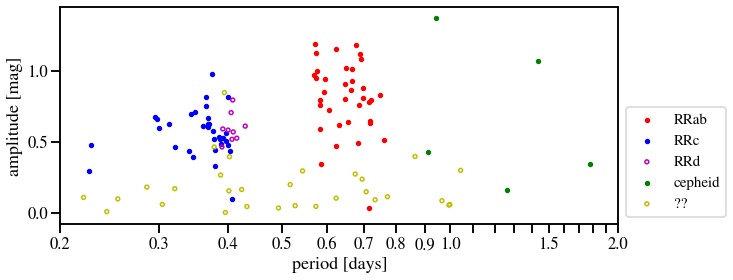

In [19]:
# classification
plt.figure(figsize=(10,4))
plt.scatter(summary['period'][rrab],summary['amplitude'][rrab],c='r',s=15,label='RRab')
plt.scatter(summary['period'][rrc],summary['amplitude'][rrc],c='b',s=15,label='RRc')
plt.scatter(summary['period'][rrd],summary['amplitude'][rrd],fc="none",ec='m',s=15,label='RRd')
plt.scatter(summary['period'][cepheid],summary['amplitude'][cepheid],c='g',s=15,label='cepheid')
plt.scatter(summary['period'][questionable],summary['amplitude'][questionable],fc="none",ec='y',s=15,label='??')


plt.xlabel('period [days]')
plt.ylabel('amplitude [mag]')
plt.xscale('log')

plt.xticks(ticks=np.linspace(0.2,2,19),labels=['0.2','0.3','0.4','0.5','0.6','0.7','0.8','0.9','1.0','','','','','1.5','','','','','2.0'])
# plt.axvline(0.5,linestyle='--')
# plt.axvline(0.9,linestyle='--')
plt.xlim(0.2,2.0)
plt.legend(fontsize=15,bbox_to_anchor=(1,0),loc='lower left')

(17, 12)

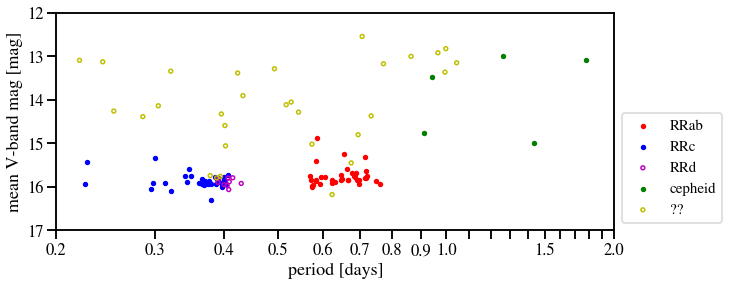

In [20]:
# classification
plt.figure(figsize=(10,4))
plt.scatter(summary['period'][rrab],summary['mean_mag'][rrab],c='r',s=15,label='RRab')
plt.scatter(summary['period'][rrc],summary['mean_mag'][rrc],c='b',s=15,label='RRc')
plt.scatter(summary['period'][rrd],summary['mean_mag'][rrd],fc="none",ec='m',s=15,label='RRd')
plt.scatter(summary['period'][cepheid],summary['mean_mag'][cepheid],c='g',s=15,label='cepheid')
plt.scatter(summary['period'][questionable],summary['mean_mag'][questionable],fc="none",ec='y',s=15,label='??')

plt.xlabel('period [days]')
plt.ylabel('mean V-band mag [mag]')
plt.xscale('log')

plt.xticks(ticks=np.linspace(0.2,2,19),labels=['0.2','0.3','0.4','0.5','0.6','0.7','0.8','0.9','1.0','','','','','1.5','','','','','2.0'])
# plt.axvline(0.5,linestyle='--')
# plt.axvline(0.9,linestyle='--')
plt.legend(fontsize=15,bbox_to_anchor=(1,0),loc='lower left')
plt.xlim(0.2,2.0)
plt.ylim(17,12)

# final lc plots

In [11]:
# plot lc
def plot_errorbars_tiled(name_list,rows_per_page,save_to_pdf,pdfname,low_sigfig=False):
    plt.rc('xtick',labelsize=17)
    plt.rc('ytick',labelsize=13)

    if save_to_pdf:
        pdf = PdfPages(pdfname)
    Nrows = int(len(name_list)/4)+1
    Npages = int(Nrows/rows_per_page)+1
    name_idx = 0
    for page in range(Npages):
        fig,axes = plt.subplots(rows_per_page,4,figsize=(20,rows_per_page*3))
        j=0
        addFinalRowLabels = True
        while j<rows_per_page*4:
            ax = axes[int(j/4)][j%4]
            try:
                if name_idx >= len(name_list):
                    if addFinalRowLabels:
                        for k in [1,2,3,4]:
                            ax_tmp = axes[int((j-k)/4)][(j-k)%4]
                            ax_tmp.set_xlabel('Phase',fontsize=22)
                        addFinalRowLabels = False
                    ax.remove()
                    j+=1
                    continue
                name = name_list[name_idx]
                phot_obj = getdata_filtered(name)
                period = phot_obj.period
                x_folded = phot_obj.x%period
                y = phot_obj.y
                yerr = phot_obj.yerr
                markers1, caps1, bars1 = ax.errorbar(x_folded/period,y,yerr,ms=2,c='k',fmt='o')
                markers2, caps2, bars2 = ax.errorbar(x_folded/period+1,y,yerr,ms=2,c='k',fmt='o')
                [bar.set_alpha(0.2) for bar in bars1]
                [bar.set_alpha(0.2) for bar in bars2]
                [cap.set_alpha(0.2) for cap in caps1]
                [cap.set_alpha(0.2) for cap in caps2]
                if low_sigfig:
                    ax.set_title(name+', P~{:.4f} d'.format(period),fontsize=19)
                else:
                    ax.set_title(name+', P={:.9f} d'.format(period),fontsize=19)
                ax.invert_yaxis()
                if (int(j/4) == rows_per_page-1):
                    ax.set_xlabel('Phase',fontsize=22)
                if int(j%4) == 0:
                    ax.set_ylabel('V (mag)',fontsize=22)
                ax.set_xticks(ticks=[0,0.5,1,1.5,2])
                j+=1
                name_idx += 1
            except:
                name_idx += 1
        plt.tight_layout()
        plt.subplots_adjust(hspace=0.5)
        pdf.savefig()
        plt.show()
        plt.close()
    pdf.close()

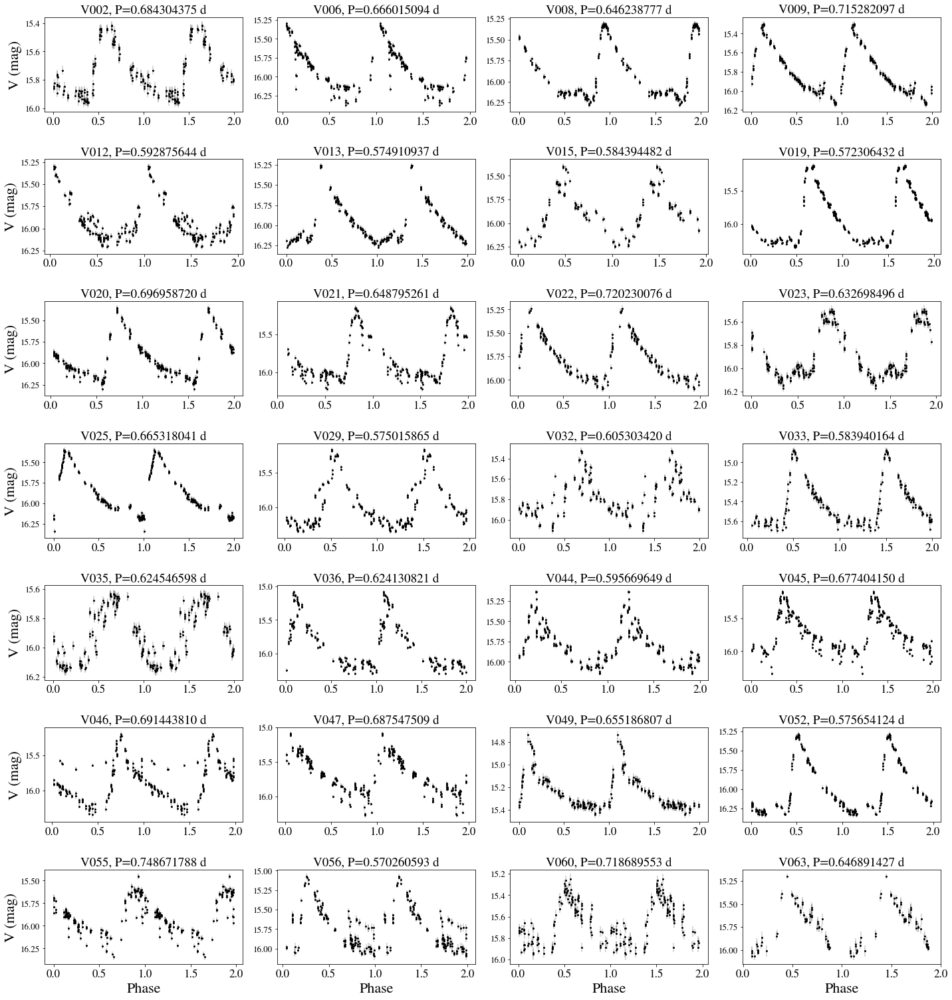

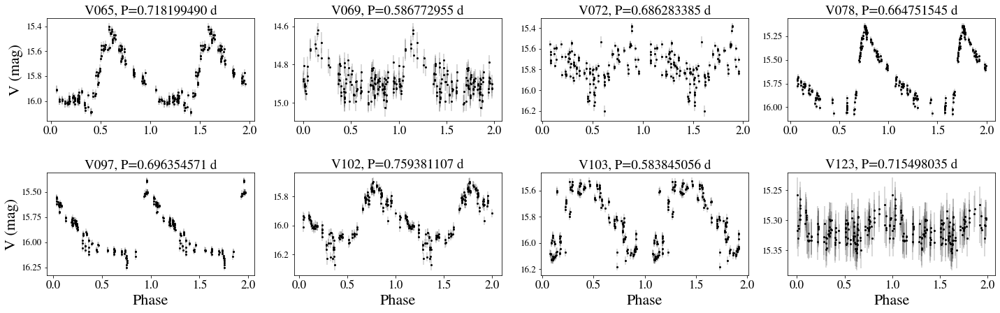

In [12]:
plot_errorbars_tiled(rrab_stars,rows_per_page=7,save_to_pdf=True,pdfname=f'RRab_ver{version}.pdf')

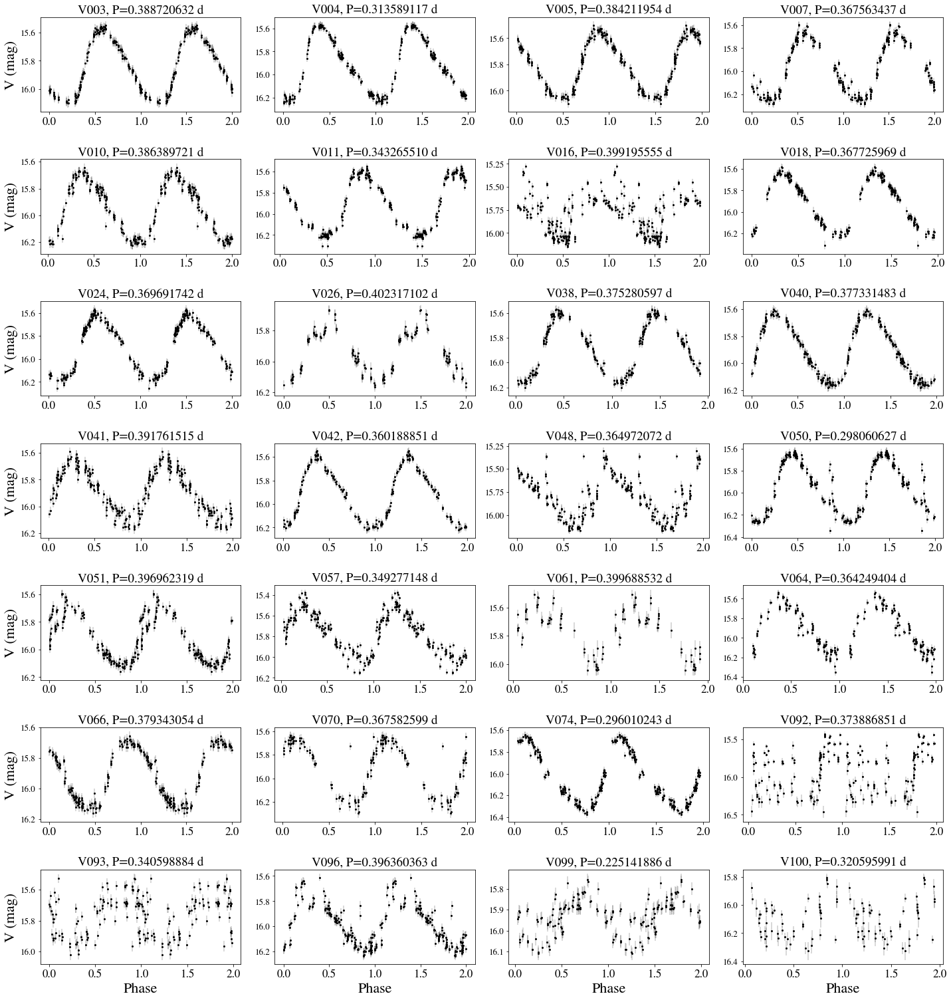

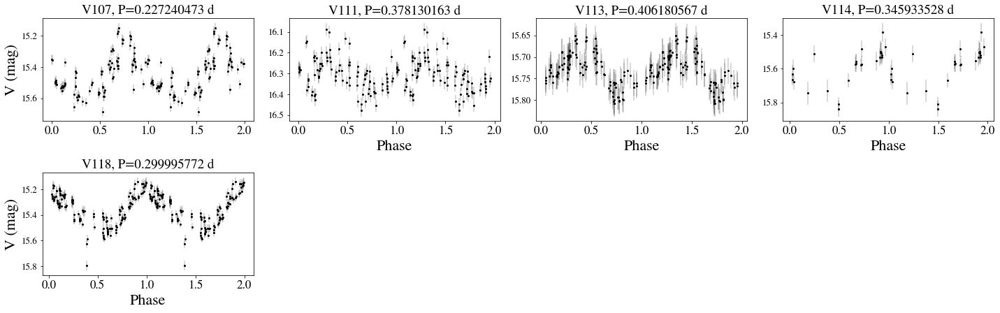

In [13]:
plot_errorbars_tiled(rrc_stars,rows_per_page=7,save_to_pdf=True,pdfname=f'RRc_ver{version}.pdf')

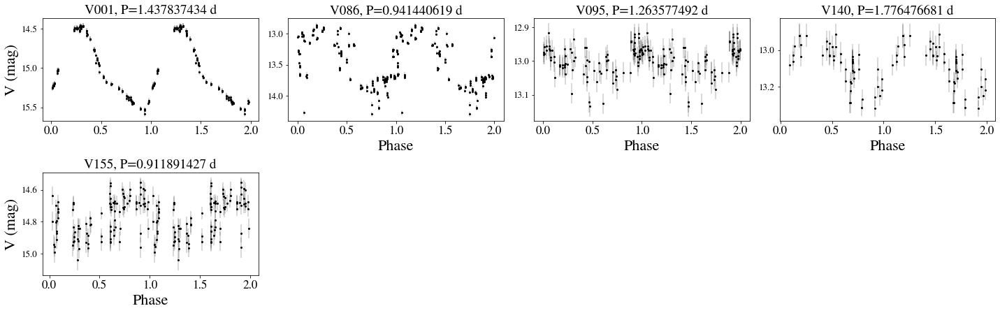

In [14]:
plot_errorbars_tiled(cepheid_stars,rows_per_page=7,save_to_pdf=True,pdfname=f'Cepheid_ver{version}.pdf')

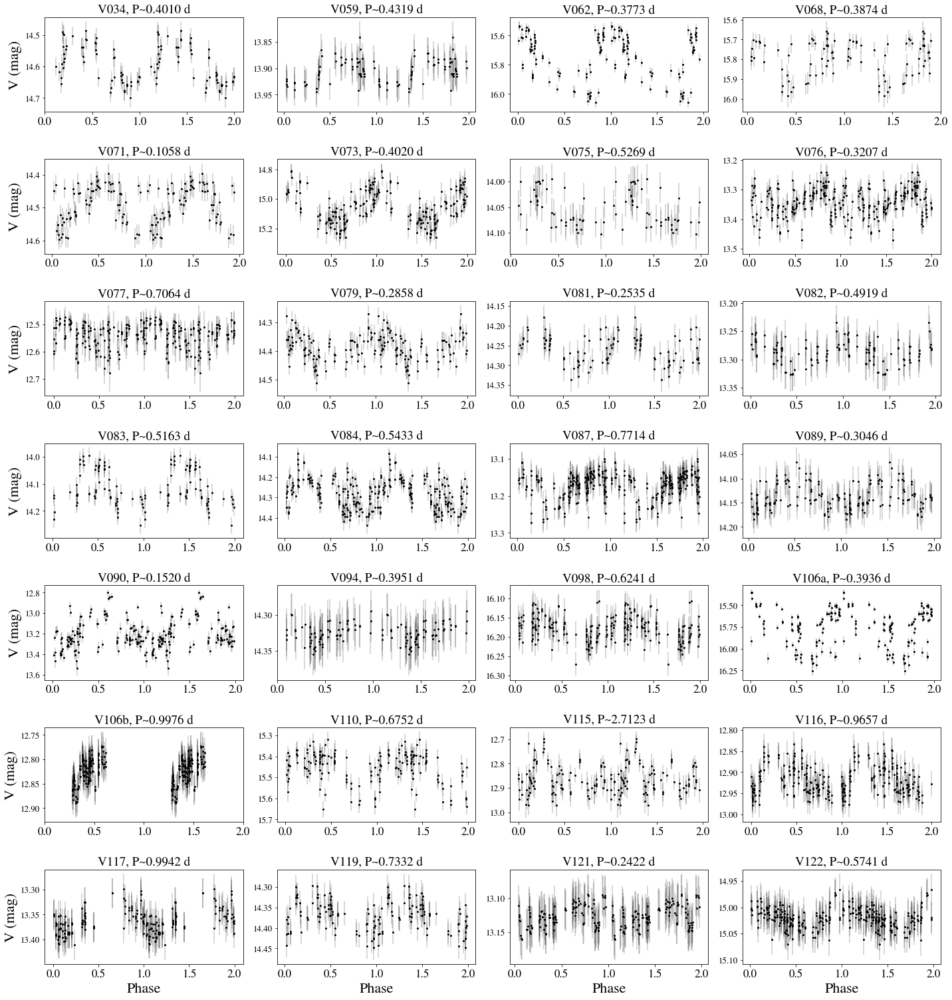

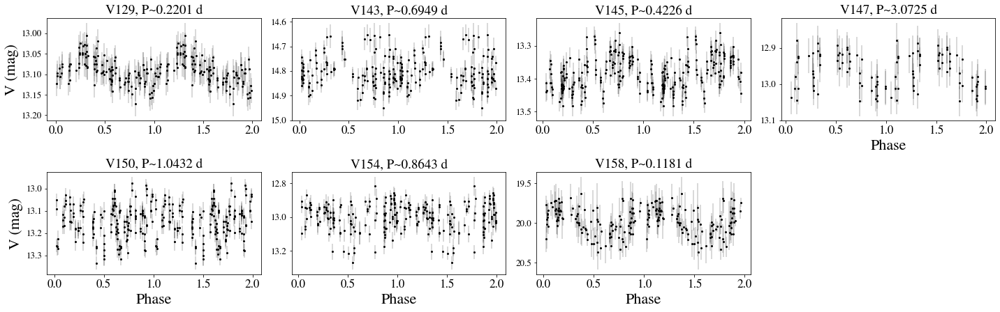

In [15]:
plot_errorbars_tiled(questionable_stars,rows_per_page=7,save_to_pdf=True,pdfname=f'RR_questionable_ver{version}.pdf',low_sigfig=True)

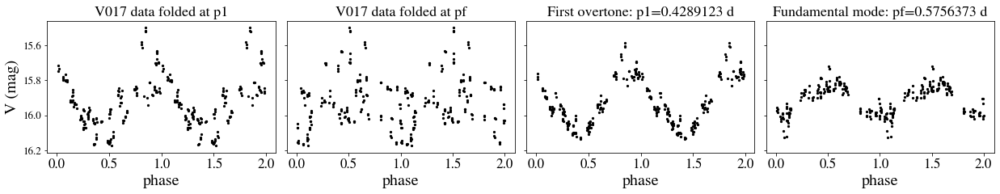

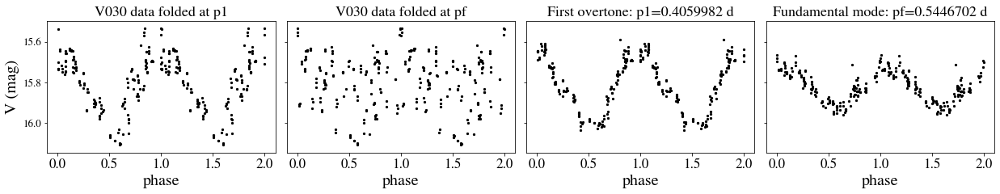

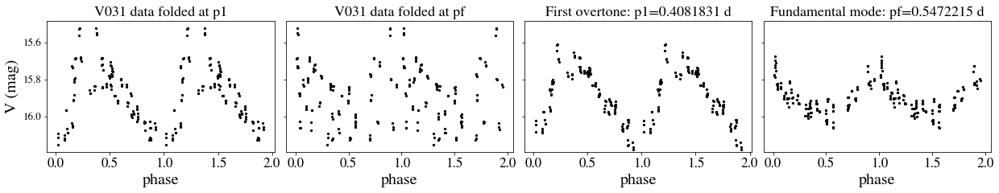

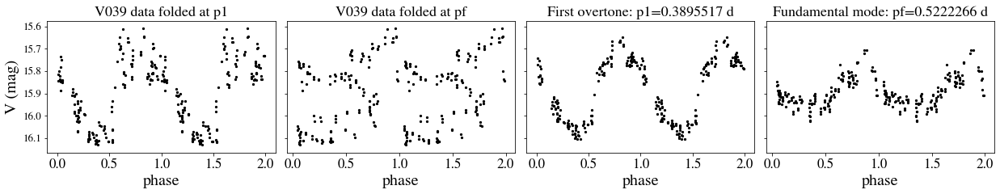

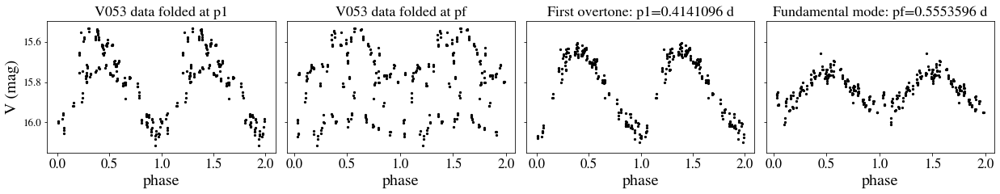

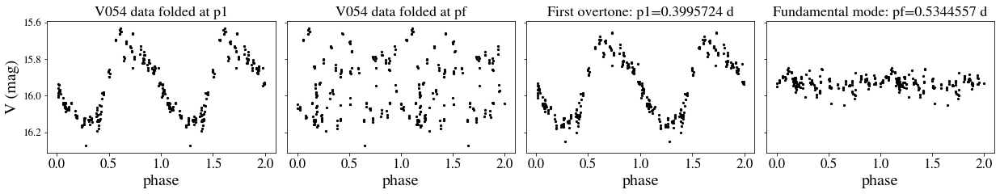

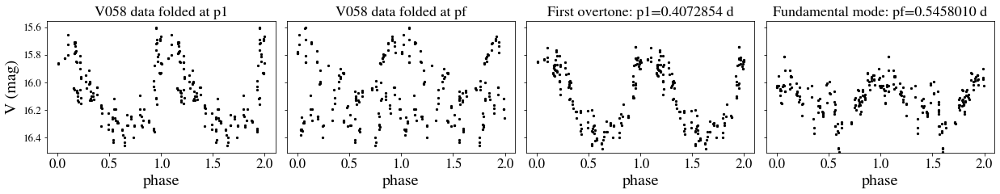

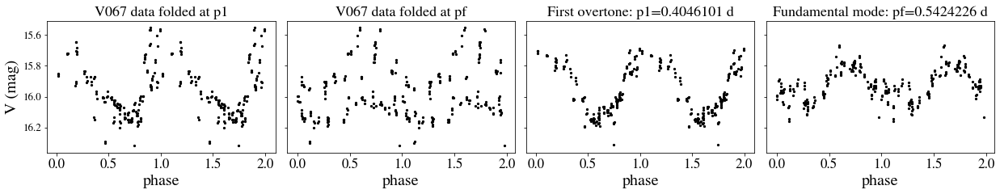

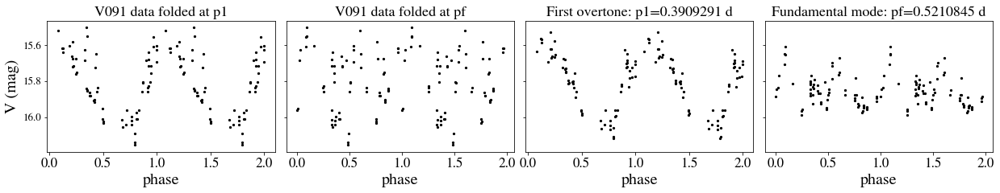

In [16]:
# plot rrd
plt.rc('xtick',labelsize=17)
plt.rc('ytick',labelsize=13)
with PdfPages(f'RRd_ver{version}.pdf') as pdf:
    for name in summary.index.values[rrd]:
        star = getdata_filtered(name)
        star.plot_lc_doublemode(p1=summary.loc[name,'p1'],p2=summary.loc[name,'pf'],figsize=(21,3),show=False)
        pdf.savefig()